In [ ]:
!pip install gdown

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import librosa
from IPython.display import Audio
import pandas as pd

In [ ]:
import gdown
import pickle
#https://drive.google.com/file/d/1Hvhg72--mtSAWM7kjO0Btl5pPSekyUd-/view?usp=sharing

# Google Drive file ID
file_id = '1Hvhg72--mtSAWM7kjO0Btl5pPSekyUd-'
# Construct the actual URL to download
download_url = f'https://drive.google.com/uc?id={file_id}'
# Download the file to a specified path
output = 'my_dataframe.pkl'
gdown.download(download_url, output, quiet=False)

# Load the pickle file
with open(output, 'rb') as file:
    df = pickle.load(file)

Downloading...
From (original): https://drive.google.com/uc?id=1Hvhg72--mtSAWM7kjO0Btl5pPSekyUd-
From (redirected): https://drive.google.com/uc?id=1Hvhg72--mtSAWM7kjO0Btl5pPSekyUd-&confirm=t&uuid=ead19439-45bd-424a-a47f-724146aa1bc3
To: /content/my_dataframe.pkl
100%|██████████| 1.34G/1.34G [00:19<00:00, 67.8MB/s]


In [ ]:
df.head()

,filenames,segments,labels,preprocessed_segments
0,HW1_Q5_810801072_Male.mp3,"[-0.08527799, -0.13787863, -0.12788689, -0.137...",male,"[0.04763013938257972, -0.21916513393886627, -0..."
1,HW1.Q4j.810102087_female.mp30,"[0.01914437, 0.034317132, 0.036678635, 0.04266...",female,"[0.024746961063888705, 0.14951891683359123, 0...."
2,HW1.Q4j.810102087_female.mp31,"[-0.018386144, -0.01965423, -0.018794548, -0.0...",female,"[0.014966757555487441, 0.0014389430690294061, ..."
3,HW1_Q3_810103262_male.mp3,"[0.10974249, 0.12175329, 0.054077126, 0.017636...",male,"[0.1471788045601028, 0.16015808521231148, 0.04..."
4,HW1_Q6_810600133_female.mp30,"[0.004859426, 0.005794212, 0.002097068, 0.0073...",female,"[-0.01087704884091554, -0.02433314371805869, 0..."


In [ ]:
import re
def extract_student_id(filename):
    pattern = r"\d{9}"
    match = re.search(pattern, filename)
    if match:
        return match.group(0)
    else:
        return None

#extract student_ID from filename
student_ID = df['filenames'].apply(extract_student_id)
df.insert(0, 'student_ID', student_ID)

In [ ]:
df.head()

,student_ID,filenames,segments,labels,preprocessed_segments
0,810801072,HW1_Q5_810801072_Male.mp3,"[-0.08527799, -0.13787863, -0.12788689, -0.137...",male,"[0.04763013938257972, -0.21916513393886627, -0..."
1,810102087,HW1.Q4j.810102087_female.mp30,"[0.01914437, 0.034317132, 0.036678635, 0.04266...",female,"[0.024746961063888705, 0.14951891683359123, 0...."
2,810102087,HW1.Q4j.810102087_female.mp31,"[-0.018386144, -0.01965423, -0.018794548, -0.0...",female,"[0.014966757555487441, 0.0014389430690294061, ..."
3,810103262,HW1_Q3_810103262_male.mp3,"[0.10974249, 0.12175329, 0.054077126, 0.017636...",male,"[0.1471788045601028, 0.16015808521231148, 0.04..."
4,810600133,HW1_Q6_810600133_female.mp30,"[0.004859426, 0.005794212, 0.002097068, 0.0073...",female,"[-0.01087704884091554, -0.02433314371805869, 0..."


In [ ]:
sr = 22050 #sample rate

In [ ]:
np.random.seed(42)
# Generate a random number from 0 to len(df)-1
random_sample = np.random.randint(0, len(df))

print('raw data')
display(Audio(df['segments'][random_sample], rate=sr))
print('preprocessed data')
display(Audio(df['preprocessed_segments'][random_sample], rate=sr))

raw data


preprocessed data


In [ ]:
feature_df = df.drop(columns = ['segments'])
feature_df = feature_df[feature_df['labels'].isin(['female', 'male'])]

## example of applying feature extraction function

In [ ]:
def zero_crossing_rate(y):
    zero_crossing_rate = np.mean(librosa.feature.zero_crossing_rate(y=y).T, axis=0)
    return zero_crossing_rate[0]

In [ ]:
feature_df['zero_crossing_rate'] = feature_df['preprocessed_segments'].apply(zero_crossing_rate)

In [ ]:
feature_df.head()

,student_ID,filenames,labels,preprocessed_segments,zero_crossing_rate
0,810801072,HW1_Q5_810801072_Male.mp3,male,"[0.04763013938257972, -0.21916513393886627, -0...",0.046447
1,810102087,HW1.Q4j.810102087_female.mp30,female,"[0.024746961063888705, 0.14951891683359123, 0....",0.080578
2,810102087,HW1.Q4j.810102087_female.mp31,female,"[0.014966757555487441, 0.0014389430690294061, ...",0.082027
3,810103262,HW1_Q3_810103262_male.mp3,male,"[0.1471788045601028, 0.16015808521231148, 0.04...",0.062571
4,810600133,HW1_Q6_810600133_female.mp30,female,"[-0.01087704884091554, -0.02433314371805869, 0...",0.119926


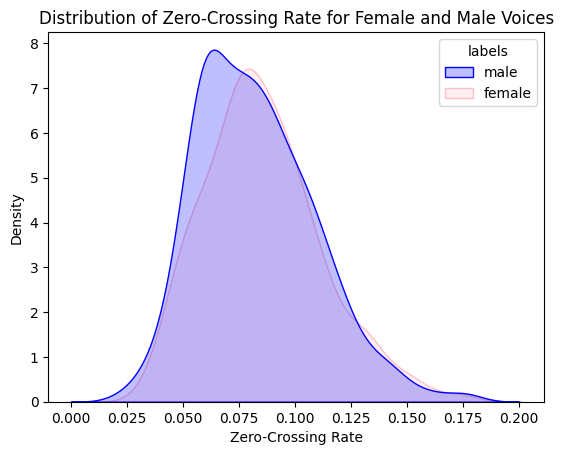

In [ ]:
import seaborn as sns

sns.kdeplot(data=feature_df, x='zero_crossing_rate', hue='labels', fill=True, palette={'female': 'pink', 'male': 'blue'})
plt.title('Distribution of Zero-Crossing Rate for Female and Male Voices')
plt.xlabel('Zero-Crossing Rate')
plt.ylabel('Density')
plt.show()

## Feature extraction functions

### Spectral centroid

[Text(0.5, 1.0, 'log-scaled spectrogram')]

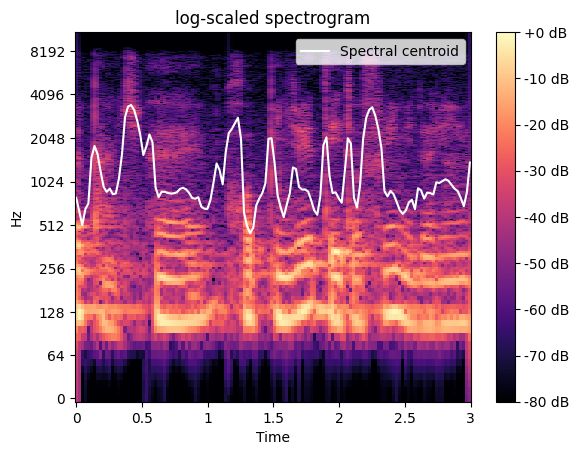

In [ ]:
y = feature_df['preprocessed_segments'][0]
cent = librosa.feature.spectral_centroid(y=y, sr=sr)
S, phase = librosa.magphase(librosa.stft(y=y))
times = librosa.times_like(cent)
fig, ax = plt.subplots()
img = librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max),
                         y_axis='log', x_axis='time', ax=ax)
fig.colorbar(img, ax=ax, format='%+2.0f dB')
ax.plot(times, cent.T, label='Spectral centroid', color='w')
ax.legend(loc='upper right')
ax.set(title='log-scaled spectrogram')

In [ ]:
def extract_spectral_centroid(audio_data, sr=22050):
  cent = librosa.feature.spectral_centroid(y=audio_data, sr=sr)
  return np.mean(cent)

In [ ]:
feature_df['spectral_centroid'] = feature_df['preprocessed_segments'].apply(extract_spectral_centroid)

In [ ]:
feature_df.head()

,student_ID,filenames,labels,preprocessed_segments,zero_crossing_rate,spectral_centroid
0,810801072,HW1_Q5_810801072_Male.mp3,male,"[0.04763013938257972, -0.21916513393886627, -0...",0.046447,1216.590875
1,810102087,HW1.Q4j.810102087_female.mp30,female,"[0.024746961063888705, 0.14951891683359123, 0....",0.080578,1842.679806
2,810102087,HW1.Q4j.810102087_female.mp31,female,"[0.014966757555487441, 0.0014389430690294061, ...",0.082027,1641.495089
3,810103262,HW1_Q3_810103262_male.mp3,male,"[0.1471788045601028, 0.16015808521231148, 0.04...",0.062571,1058.005766
4,810600133,HW1_Q6_810600133_female.mp30,female,"[-0.01087704884091554, -0.02433314371805869, 0...",0.119926,2203.415729


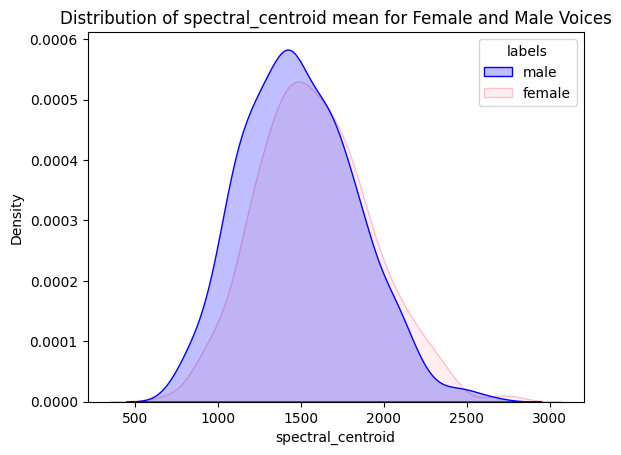

In [ ]:
import seaborn as sns

sns.kdeplot(data=feature_df, x='spectral_centroid', hue='labels', fill=True, palette={'female': 'pink', 'male': 'blue'})
plt.title('Distribution of spectral_centroid mean for Female and Male Voices')
plt.xlabel('spectral_centroid')
plt.ylabel('Density')
plt.show()

### Spectral Contrast

In [ ]:
y = feature_df['preprocessed_segments'][0]
S = np.abs(librosa.stft(y))
contrast = librosa.feature.spectral_contrast(S=S, sr=sr)

[Text(0, 0.5, 'Frequency bands'), Text(0.5, 1.0, 'Spectral contrast')]

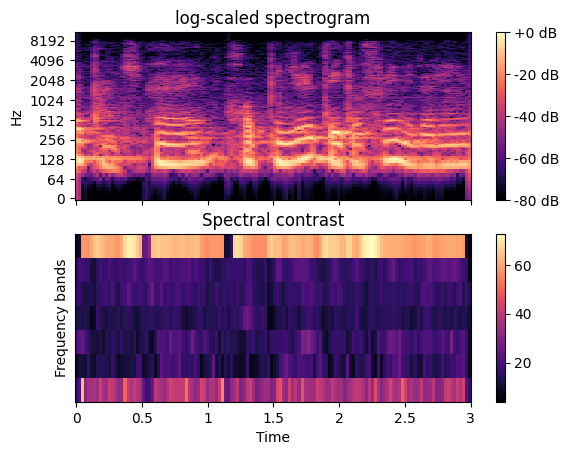

In [ ]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(nrows=2, sharex=True)
img1 = librosa.display.specshow(librosa.amplitude_to_db(S,
                                                 ref=np.max),
                         y_axis='log', x_axis='time', ax=ax[0])
fig.colorbar(img1, ax=[ax[0]], format='%+2.0f dB')
ax[0].set(title='log-scaled spectrogram')
ax[0].label_outer()
img2 = librosa.display.specshow(contrast, x_axis='time', ax=ax[1])
fig.colorbar(img2, ax=[ax[1]])
ax[1].set(ylabel='Frequency bands', title='Spectral contrast')

In [ ]:
def extract_spectral_contrast(y, sr=22050):
  S = np.abs(librosa.stft(y))
  contrast = librosa.feature.spectral_contrast(S=S, sr=sr)
  mean_contrast = np.mean(contrast, axis = 1)
  return mean_contrast

In [ ]:
spectral_contrasts = feature_df['preprocessed_segments'].apply(lambda x: pd.Series(extract_spectral_contrast(x)))

In [ ]:
# Apply the function to each segment in the DataFrame
#feature_df[['sp_contrast1', 'sp_contrast2', 'sp_contrast3', 'sp_contrast4', 'sp_contrast5', 'sp_contrast6', 'sp_contrast7']] = spectral_contrasts
spectral_contrast_features = [f'sp_contrast{i+1}' for i in range(7)]
feature_df[spectral_contrast_features] = spectral_contrasts
feature_df.head()

,student_ID,filenames,labels,preprocessed_segments,zero_crossing_rate,spectral_centroid,sp_contrast1,sp_contrast2,sp_contrast3,sp_contrast4,sp_contrast5,sp_contrast6,sp_contrast7
0,810801072,HW1_Q5_810801072_Male.mp3,male,"[0.04763013938257972, -0.21916513393886627, -0...",0.046447,1216.590875,35.945339,14.833233,17.133069,14.209448,16.641099,18.129430,58.359187
1,810102087,HW1.Q4j.810102087_female.mp30,female,"[0.024746961063888705, 0.14951891683359123, 0....",0.080578,1842.679806,34.175671,19.665701,18.397956,15.685574,16.155232,21.386685,67.970321
2,810102087,HW1.Q4j.810102087_female.mp31,female,"[0.014966757555487441, 0.0014389430690294061, ...",0.082027,1641.495089,37.638390,19.046295,16.427023,15.194170,17.781970,21.401515,66.283835
3,810103262,HW1_Q3_810103262_male.mp3,male,"[0.1471788045601028, 0.16015808521231148, 0.04...",0.062571,1058.005766,32.415697,20.877993,26.903505,21.299956,22.139199,24.830676,53.141270
4,810600133,HW1_Q6_810600133_female.mp30,female,"[-0.01087704884091554, -0.02433314371805869, 0...",0.119926,2203.415729,32.471823,19.488150,20.589765,20.597781,21.702684,20.653583,64.771788


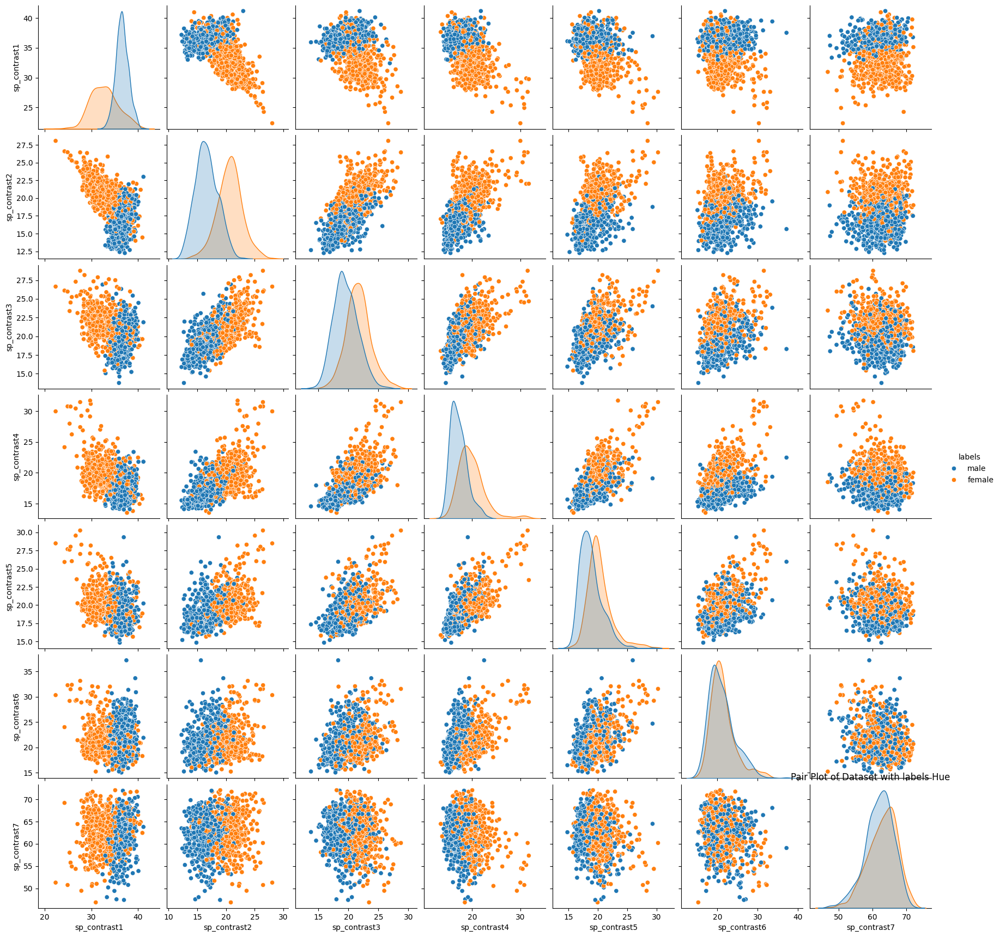

In [ ]:
target_label = ['labels']
columns_to_include = target_label + spectral_contrast_features # List the desired columns
contrst_df = feature_df[columns_to_include].copy()

sns.pairplot(data=contrst_df, hue='labels', vars=spectral_contrast_features)
plt.title("Pair Plot of Dataset with labels Hue")
plt.show()

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

labels = feature_df['labels']
sp_contrasts = np.array(feature_df[spectral_contrast_features])
# Apply LDA to MFCCs
lda_sp_contrast = LinearDiscriminantAnalysis(n_components=1)
sp_contrast_lda = lda_sp_contrast.fit_transform(sp_contrasts, labels)
feature_df['sp_contrast_lda'] = sp_contrast_lda


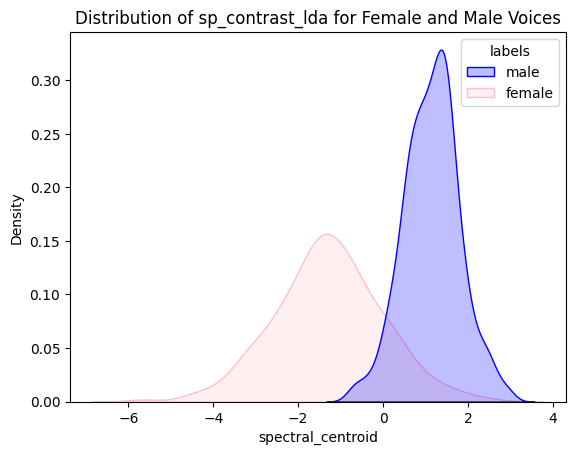

In [ ]:
sns.kdeplot(data=feature_df, x='sp_contrast_lda', hue='labels', fill=True, palette={'female': 'pink', 'male': 'blue'})
plt.title('Distribution of sp_contrast_lda for Female and Male Voices')
plt.xlabel('spectral_centroid')
plt.ylabel('Density')
plt.show()

## MFCC and Log Mel Spectrogram

In [ ]:
y = feature_df['preprocessed_segments'][0]

In [ ]:
S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128,
                                   fmax=8000)
#mfccs = librosa.feature.mfcc(S=librosa.power_to_db(S))
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=20)

[Text(0.5, 1.0, 'MFCC')]

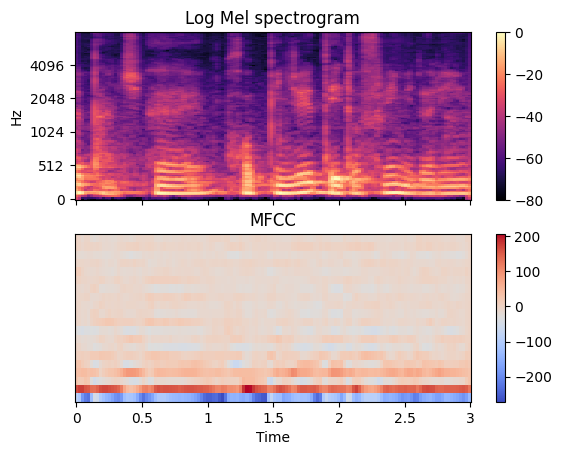

In [ ]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(nrows=2, sharex=True)

#power to db convert mel spectrogram to log mel spectrogram
img = librosa.display.specshow(librosa.power_to_db(S, ref=np.max),
                               x_axis='time', y_axis='mel', fmax=8000,
                               ax=ax[0])
fig.colorbar(img, ax=[ax[0]])
ax[0].set(title='Log Mel spectrogram')
ax[0].label_outer()
img = librosa.display.specshow(mfccs, x_axis='time', ax=ax[1])
fig.colorbar(img, ax=[ax[1]])
ax[1].set(title='MFCC')

In [ ]:
n_mfcc = 13
def extract_mfcc(audio_data, sr=22050, n_mfcc=n_mfcc):
  mfccs = librosa.feature.mfcc(y=audio_data, sr=sr, n_mfcc=n_mfcc)
  return np.mean(mfccs.T, axis=0)

In [ ]:
mfccs = feature_df['preprocessed_segments'].apply(lambda x: pd.Series(extract_mfcc(x)))

In [ ]:
# Apply the function to each segment in the DataFrame
mfcc_features = [f'mfcc{i+1}' for i in range(n_mfcc)]
feature_df[mfcc_features] = mfccs
feature_df.head()

,student_ID,filenames,labels,preprocessed_segments,zero_crossing_rate,spectral_centroid,sp_contrast1,sp_contrast2,sp_contrast3,sp_contrast4,...,mfcc4,mfcc5,mfcc6,mfcc7,mfcc8,mfcc9,mfcc10,mfcc11,mfcc12,mfcc13
0,810801072,HW1_Q5_810801072_Male.mp3,male,"[0.04763013938257972, -0.21916513393886627, -0...",0.046447,1216.590875,35.945339,14.833233,17.133069,14.209448,...,49.398087,3.662226,7.291062,-23.291685,-1.419220,-22.928984,-2.277714,-14.823403,-10.439934,-7.369753
1,810102087,HW1.Q4j.810102087_female.mp30,female,"[0.024746961063888705, 0.14951891683359123, 0....",0.080578,1842.679806,34.175671,19.665701,18.397956,15.685574,...,20.458353,-17.999356,1.703165,-43.625930,9.469150,-40.149396,-2.142366,-22.512051,-15.996787,-18.894576
2,810102087,HW1.Q4j.810102087_female.mp31,female,"[0.014966757555487441, 0.0014389430690294061, ...",0.082027,1641.495089,37.638390,19.046295,16.427023,15.194170,...,10.470481,-17.763962,9.712767,-37.032988,7.091406,-33.324287,-2.642051,-20.920856,-23.709166,-17.663896
3,810103262,HW1_Q3_810103262_male.mp3,male,"[0.1471788045601028, 0.16015808521231148, 0.04...",0.062571,1058.005766,32.415697,20.877993,26.903505,21.299956,...,23.679089,0.363414,-28.565976,-27.831085,-24.447473,-27.730897,-18.113441,-19.076435,-12.650615,-10.723089
4,810600133,HW1_Q6_810600133_female.mp30,female,"[-0.01087704884091554, -0.02433314371805869, 0...",0.119926,2203.415729,32.471823,19.488150,20.589765,20.597781,...,42.219717,-49.529294,12.096251,-33.373132,-13.813165,-18.440025,5.463366,-26.797058,-24.678575,-26.683791


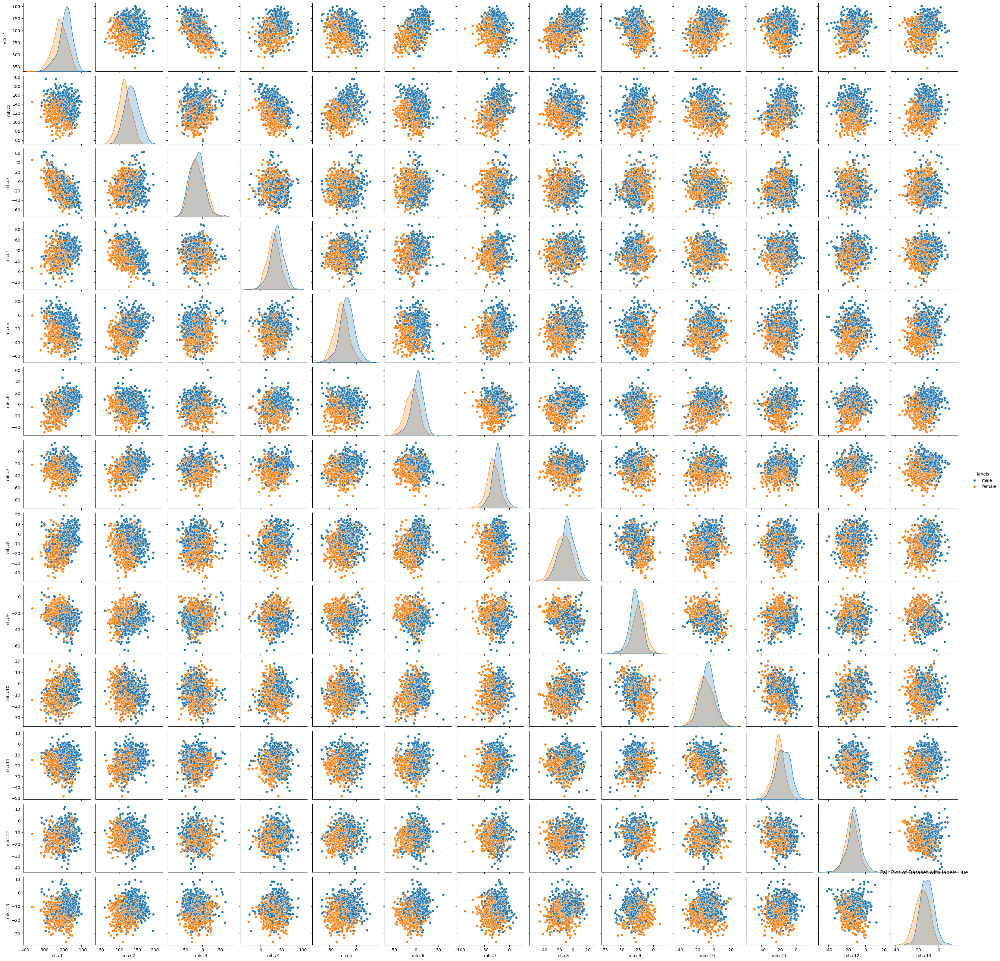

In [ ]:
target_label = ['labels']
columns_to_include_mfccs = target_label + mfcc_features # List the desired columns
mfccs_df = feature_df[columns_to_include_mfccs].copy()

sns.pairplot(mfccs_df, hue='labels', vars=mfcc_features)
plt.title("Pair Plot of Dataset with labels Hue")
plt.show()

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
#filtered_df = contrst_df[contrst_df['labels'].isin(['female', 'male'])]
labels = feature_df['labels']

mfccs_data = np.array(feature_df[mfcc_features])
# Apply LDA to MFCCs
lda_mfccs = LinearDiscriminantAnalysis(n_components=1)
mfccs_lda = lda_mfccs.fit_transform(mfccs_data, labels)
feature_df['mfccs_lda'] = mfccs_lda

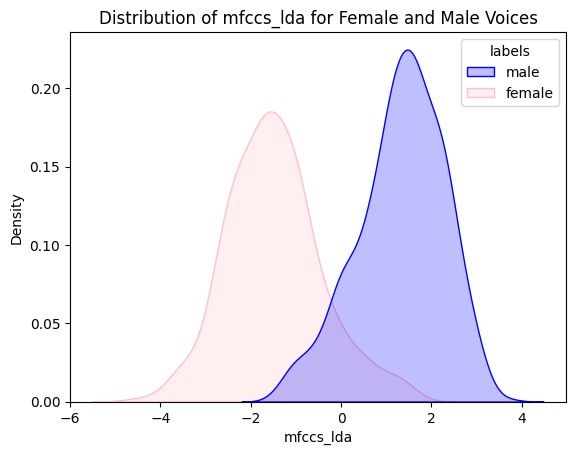

In [ ]:
sns.kdeplot(data=feature_df, x='mfccs_lda', hue='labels', fill=True, palette={'female': 'pink', 'male': 'blue'})
plt.title('Distribution of mfccs_lda for Female and Male Voices')
plt.xlabel('mfccs_lda')
plt.ylabel('Density')
plt.show()

## Energy

In [ ]:
y = feature_df['preprocessed_segments'][0]

In [ ]:
S, phase = librosa.magphase(librosa.stft(y))
rms = librosa.feature.rms(y=y)

[Text(0.5, 1.0, 'log-scaled spectrogram')]

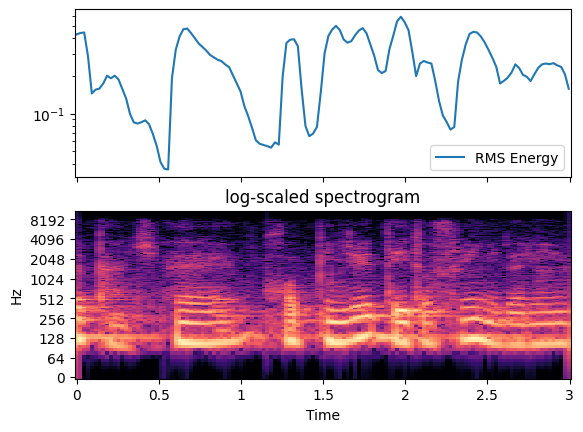

In [ ]:
fig, ax = plt.subplots(nrows=2, sharex=True)
times = librosa.times_like(rms)
ax[0].semilogy(times, rms[0], label='RMS Energy')
ax[0].set(xticks=[])
ax[0].legend()
ax[0].label_outer()
librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max),
                         y_axis='log', x_axis='time', ax=ax[1])
ax[1].set(title='log-scaled spectrogram')

In [ ]:
def extract_rms_energy(y):
  rms_energy = np.mean(librosa.feature.rms(y=y).T, axis=0)
  return rms_energy[0]

In [ ]:
feature_df['mean_rms_energy'] = feature_df['preprocessed_segments'].apply(extract_rms_energy)

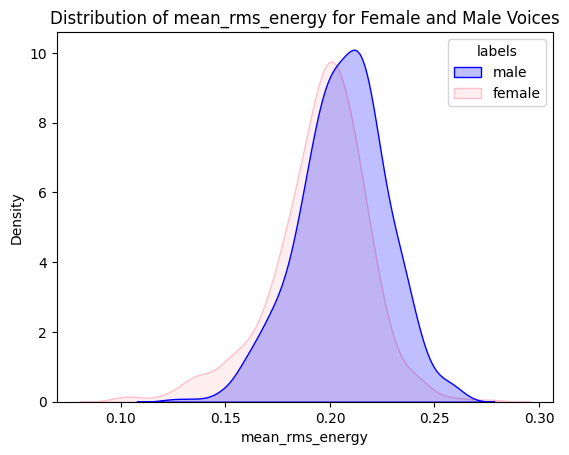

In [ ]:
sns.kdeplot(data=feature_df, x='mean_rms_energy', hue='labels', fill=True, palette={'female': 'pink', 'male': 'blue'})
plt.title('Distribution of mean_rms_energy for Female and Male Voices')
plt.xlabel('mean_rms_energy')
plt.ylabel('Density')
plt.show()

### Time domain features pair plot

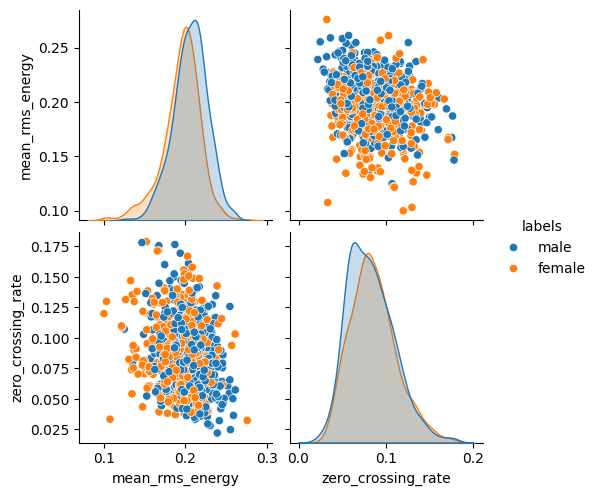

In [ ]:
filtered_df = feature_df[['labels', 'mean_rms_energy', 'zero_crossing_rate']]
sns.pairplot(filtered_df, hue='labels', vars=['mean_rms_energy', 'zero_crossing_rate'])
plt.show()

## Spectrogram Bandwidth

In [ ]:
y = feature_df['preprocessed_segments'][0]

In [ ]:
S, phase = librosa.magphase(librosa.stft(y=y))
spec_bw = librosa.feature.spectral_bandwidth(S=S)

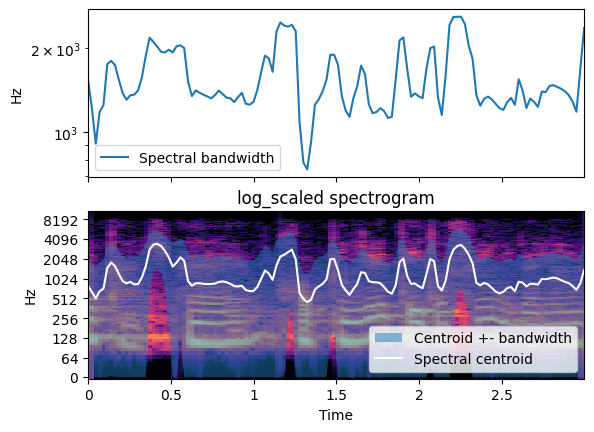

In [ ]:
fig, ax = plt.subplots(nrows=2, sharex=True)
times = librosa.times_like(spec_bw)
centroid = librosa.feature.spectral_centroid(S=S)
ax[0].semilogy(times, spec_bw[0], label='Spectral bandwidth')
ax[0].set(ylabel='Hz', xticks=[], xlim=[times.min(), times.max()])
ax[0].legend()
ax[0].label_outer()
librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max),
                         y_axis='log', x_axis='time', ax=ax[1])
ax[1].set(title='log_scaled spectrogram')
ax[1].fill_between(times, np.maximum(0, centroid[0] - spec_bw[0]),
                np.minimum(centroid[0] + spec_bw[0], sr/2),
                alpha=0.5, label='Centroid +- bandwidth')
ax[1].plot(times, centroid[0], label='Spectral centroid', color='w')
ax[1].legend(loc='lower right')

In [ ]:
def extract_spectral_bandwidth(y):
  spectral_bandwidth = librosa.feature.spectral_bandwidth(y=y, sr=sr)
  return np.mean(spectral_bandwidth)

In [ ]:
feature_df['mean_spectral_bandwidth'] = feature_df['preprocessed_segments'].apply(extract_spectral_bandwidth)

In [ ]:
feature_df.head()

,student_ID,filenames,labels,preprocessed_segments,zero_crossing_rate,spectral_centroid,sp_contrast1,sp_contrast2,sp_contrast3,sp_contrast4,...,mfcc7,mfcc8,mfcc9,mfcc10,mfcc11,mfcc12,mfcc13,mfccs_lda,mean_rms_energy,mean_spectral_bandwidth
0,810801072,HW1_Q5_810801072_Male.mp3,male,"[0.04763013938257972, -0.21916513393886627, -0...",0.046447,1216.590875,35.945339,14.833233,17.133069,14.209448,...,-23.291685,-1.419220,-22.928984,-2.277714,-14.823403,-10.439934,-7.369753,2.928460,0.246633,1555.350426
1,810102087,HW1.Q4j.810102087_female.mp30,female,"[0.024746961063888705, 0.14951891683359123, 0....",0.080578,1842.679806,34.175671,19.665701,18.397956,15.685574,...,-43.625930,9.469150,-40.149396,-2.142366,-22.512051,-15.996787,-18.894576,-0.818948,0.200375,2023.423835
2,810102087,HW1.Q4j.810102087_female.mp31,female,"[0.014966757555487441, 0.0014389430690294061, ...",0.082027,1641.495089,37.638390,19.046295,16.427023,15.194170,...,-37.032988,7.091406,-33.324287,-2.642051,-20.920856,-23.709166,-17.663896,-0.883205,0.178559,1788.813742
3,810103262,HW1_Q3_810103262_male.mp3,male,"[0.1471788045601028, 0.16015808521231148, 0.04...",0.062571,1058.005766,32.415697,20.877993,26.903505,21.299956,...,-27.831085,-24.447473,-27.730897,-18.113441,-19.076435,-12.650615,-10.723089,-0.592432,0.227596,1057.725269
4,810600133,HW1_Q6_810600133_female.mp30,female,"[-0.01087704884091554, -0.02433314371805869, 0...",0.119926,2203.415729,32.471823,19.488150,20.589765,20.597781,...,-33.373132,-13.813165,-18.440025,5.463366,-26.797058,-24.678575,-26.683791,-3.007972,0.154137,1933.810185


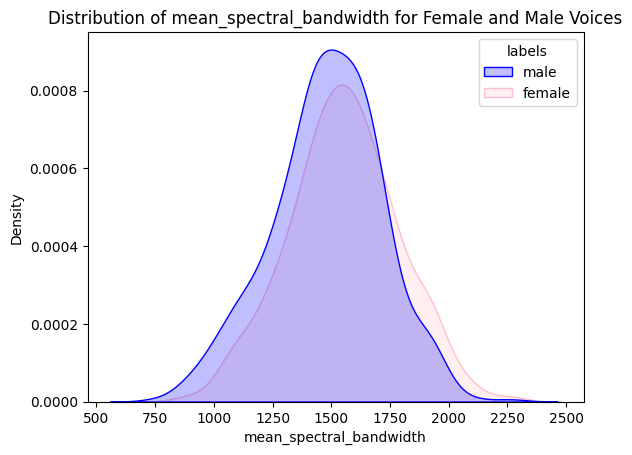

In [ ]:
sns.kdeplot(data=feature_df, x='mean_spectral_bandwidth', hue='labels', fill=True, palette={'female': 'pink', 'male': 'blue'})
plt.title('Distribution of mean_spectral_bandwidth for Female and Male Voices')
plt.xlabel('mean_spectral_bandwidth')
plt.ylabel('Density')
plt.show()

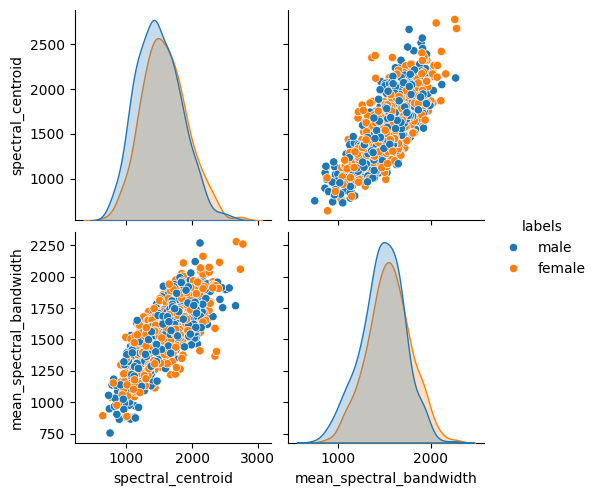

In [ ]:
filtered_df = feature_df[['labels', 'spectral_centroid', 'mean_spectral_bandwidth']]
sns.pairplot(filtered_df, hue='labels', vars=['spectral_centroid', 'mean_spectral_bandwidth'])
plt.show()

# Gender Classification

In [ ]:
feature_df.head()

,student_ID,filenames,labels,preprocessed_segments,zero_crossing_rate,spectral_centroid,sp_contrast1,sp_contrast2,sp_contrast3,sp_contrast4,...,mfcc7,mfcc8,mfcc9,mfcc10,mfcc11,mfcc12,mfcc13,mfccs_lda,mean_rms_energy,mean_spectral_bandwidth
0,810801072,HW1_Q5_810801072_Male.mp3,male,"[0.04763013938257972, -0.21916513393886627, -0...",0.046447,1216.590875,35.945339,14.833233,17.133069,14.209448,...,-23.291685,-1.419220,-22.928984,-2.277714,-14.823403,-10.439934,-7.369753,2.928460,0.246633,1555.350426
1,810102087,HW1.Q4j.810102087_female.mp30,female,"[0.024746961063888705, 0.14951891683359123, 0....",0.080578,1842.679806,34.175671,19.665701,18.397956,15.685574,...,-43.625930,9.469150,-40.149396,-2.142366,-22.512051,-15.996787,-18.894576,-0.818948,0.200375,2023.423835
2,810102087,HW1.Q4j.810102087_female.mp31,female,"[0.014966757555487441, 0.0014389430690294061, ...",0.082027,1641.495089,37.638390,19.046295,16.427023,15.194170,...,-37.032988,7.091406,-33.324287,-2.642051,-20.920856,-23.709166,-17.663896,-0.883205,0.178559,1788.813742
3,810103262,HW1_Q3_810103262_male.mp3,male,"[0.1471788045601028, 0.16015808521231148, 0.04...",0.062571,1058.005766,32.415697,20.877993,26.903505,21.299956,...,-27.831085,-24.447473,-27.730897,-18.113441,-19.076435,-12.650615,-10.723089,-0.592432,0.227596,1057.725269
4,810600133,HW1_Q6_810600133_female.mp30,female,"[-0.01087704884091554, -0.02433314371805869, 0...",0.119926,2203.415729,32.471823,19.488150,20.589765,20.597781,...,-33.373132,-13.813165,-18.440025,5.463366,-26.797058,-24.678575,-26.683791,-3.007972,0.154137,1933.810185


In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc, classification_report
from sklearn.preprocessing import StandardScaler, MinMaxScaler

def k_fold_cross_validation(df, desiredFeatures1, desiredFeatures2, target, clf_model, feature_reduction_function = None, group_by='student_ID', k=5):

  skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)

  accuracies = []
  all_y_test = []
  all_y_pred = []

  unique_df = df[[target, group_by]].copy()
  unique_df = unique_df.drop_duplicates(subset=group_by)
  X = np.array(unique_df[group_by])
  y = np.array(unique_df[target])

  # Cross-validation loop
  for train_index, test_index in skf.split(X, y):

    X_train_ID, X_test_ID = X[train_index], X[test_index]

    train_df = df[df[group_by].isin(X_train_ID)]
    test_df = df[df[group_by].isin(X_test_ID)]

    X_train1 = train_df[desiredFeatures1]
    y_train = train_df[target]

    X_test1 = test_df[desiredFeatures1]
    y_test = test_df[target]

    scaler = MinMaxScaler().fit(X_train1)
    X_train1 = scaler.transform(X_train1)
    X_test1 = scaler.transform(X_test1)

    if(feature_reduction_function):
      feature_reduction_function.fit(X_train1, y_train)
      X_train1 = feature_reduction_function.transform(X_train1)
      X_test1 = feature_reduction_function.transform(X_test1)

    if(desiredFeatures2):
      X_train2 = train_df[desiredFeatures2]
      X_test2 = test_df[desiredFeatures2]
      scaler = MinMaxScaler().fit(X_train2)
      X_train2 = scaler.transform(X_train2)
      X_test2 = scaler.transform(X_test2)
      if(feature_reduction_function):
        feature_reduction_function.fit(X_train2, y_train)
        X_train2 = feature_reduction_function.transform(X_train2)
        X_test2 = feature_reduction_function.transform(X_test2)

      X_train = np.hstack((X_train1, X_train2))
      X_test = np.hstack((X_test1, X_test2))
    else:
      X_train = X_train1
      X_test = X_test1


    # Train and evaluate model
    clf_model.fit(X_train, y_train)
    y_pred = clf_model.predict(X_test)

    all_y_test.extend(y_test)
    all_y_pred.extend(y_pred)

    accuracy = accuracy_score(y_test, y_pred)
    accuracies.append(accuracy)

    # Confusion Matrix for each fold

    #cm = confusion_matrix(y_test, y_pred)
    #cm_display = ConfusionMatrixDisplay(cm, display_labels=clf_model.classes_)
    #cm_display.plot(cmap='viridis', values_format='d')
    #plt.title('Confusion Matrix for Fold')
    #plt.show()

  cm = confusion_matrix(all_y_test, all_y_pred)
  cm_display = ConfusionMatrixDisplay(cm, display_labels=clf_model.classes_)
  cm_display.plot(cmap='viridis', values_format='d')
  plt.title('Aggregated Confusion Matrix')
  plt.show()

  avg_accuracy = np.mean(accuracies)*100
  std_accuracy = np.std(accuracies)*100
  print('report of last fold')
  print(classification_report(y_test, y_pred))
  print(f'\nCross-Validation Accuracies: {accuracies}')
  print(f'\nAverage Accuracy: {avg_accuracy}+-{std_accuracy}%')

  return avg_accuracy, std_accuracy, cm

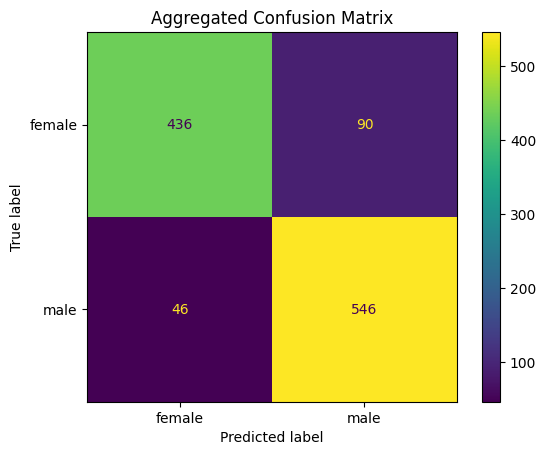

report of last fold
              precision    recall  f1-score   support

      female       0.97      0.88      0.92        95
        male       0.90      0.97      0.94       106

    accuracy                           0.93       201
   macro avg       0.93      0.93      0.93       201
weighted avg       0.93      0.93      0.93       201


Cross-Validation Accuracies: [0.8739130434782608, 0.8451882845188284, 0.8933333333333333, 0.8565022421524664, 0.9303482587064676]

Average Accuracy: 87.98570324378714+-3.0045545201353816%


(87.98570324378714,
 3.0045545201353816,
 array([[436,  90],
        [ 46, 546]]))

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors= 5)  # Adjust n_neighbors as needed

MFCC_columns = ['mfcc1', 'mfcc2', 'mfcc3', 'mfcc4', 'mfcc5', 'mfcc6', 'mfcc7',
                'mfcc8', 'mfcc9', 'mfcc10', 'mfcc11', 'mfcc12', 'mfcc13']
Sp_contrast_columns = ['sp_contrast1', 'sp_contrast2', 'sp_contrast3',
                       'sp_contrast4', 'sp_contrast5', 'sp_contrast6', 'sp_contrast7']
target = 'labels'
k_fold_cross_validation(feature_df, Sp_contrast_columns, None, target, knn, LinearDiscriminantAnalysis(), group_by ='student_ID', k=5)

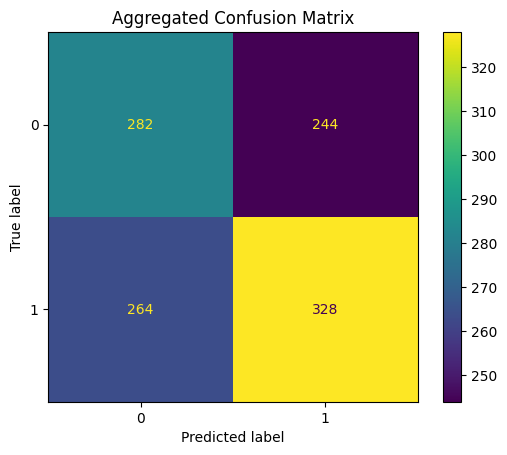

report of last fold
              precision    recall  f1-score   support

           0       0.52      0.59      0.55        95
           1       0.59      0.52      0.55       106

    accuracy                           0.55       201
   macro avg       0.55      0.55      0.55       201
weighted avg       0.56      0.55      0.55       201


Cross-Validation Accuracies: [0.5652173913043478, 0.497907949790795, 0.5377777777777778, 0.57847533632287, 0.5522388059701493]

Average Accuracy: 54.6323452233188+-2.772293426974005%


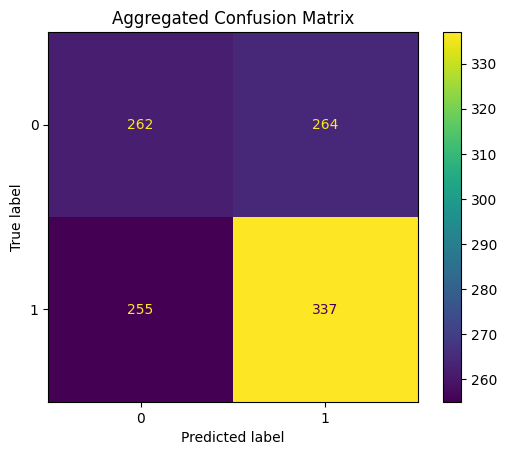

report of last fold
              precision    recall  f1-score   support

           0       0.49      0.51      0.50        95
           1       0.55      0.54      0.54       106

    accuracy                           0.52       201
   macro avg       0.52      0.52      0.52       201
weighted avg       0.52      0.52      0.52       201


Cross-Validation Accuracies: [0.5217391304347826, 0.5439330543933054, 0.5422222222222223, 0.547085201793722, 0.5223880597014925]

Average Accuracy: 53.547353370910486+-1.106166882406474%


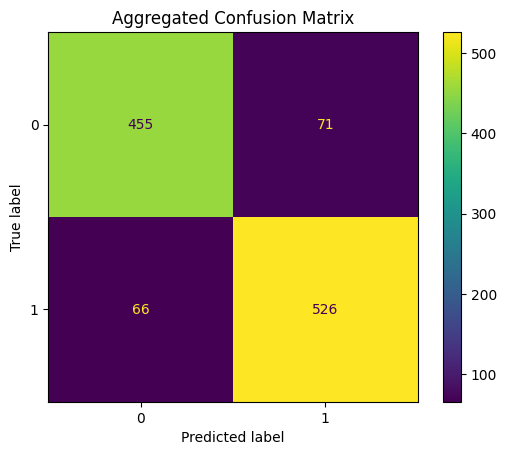

report of last fold
              precision    recall  f1-score   support

           0       0.80      0.80      0.80        95
           1       0.82      0.82      0.82       106

    accuracy                           0.81       201
   macro avg       0.81      0.81      0.81       201
weighted avg       0.81      0.81      0.81       201


Cross-Validation Accuracies: [0.8956521739130435, 0.8493723849372385, 0.9111111111111111, 0.9147982062780269, 0.8109452736318408]

Average Accuracy: 87.63758299742521+-4.016152372427262%


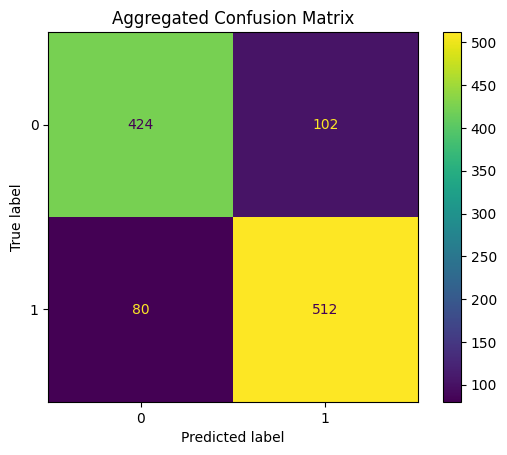

report of last fold
              precision    recall  f1-score   support

           0       0.82      0.79      0.81        95
           1       0.82      0.85      0.83       106

    accuracy                           0.82       201
   macro avg       0.82      0.82      0.82       201
weighted avg       0.82      0.82      0.82       201


Cross-Validation Accuracies: [0.8130434782608695, 0.8284518828451883, 0.8577777777777778, 0.8654708520179372, 0.8208955223880597]

Average Accuracy: 83.71279026579666+-2.0729510888796767%


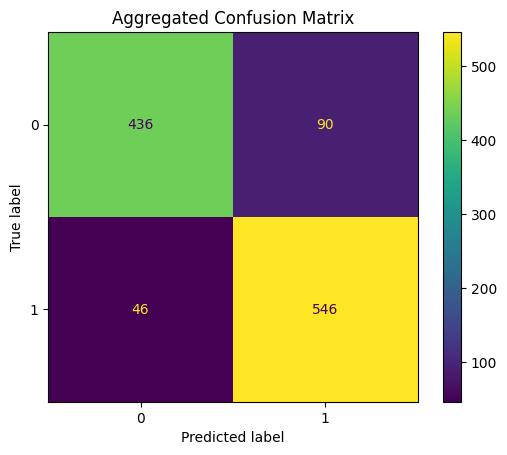

report of last fold
              precision    recall  f1-score   support

           0       0.97      0.88      0.92        95
           1       0.90      0.97      0.94       106

    accuracy                           0.93       201
   macro avg       0.93      0.93      0.93       201
weighted avg       0.93      0.93      0.93       201


Cross-Validation Accuracies: [0.8739130434782608, 0.8451882845188284, 0.8933333333333333, 0.8565022421524664, 0.9303482587064676]

Average Accuracy: 87.98570324378714+-3.0045545201353816%


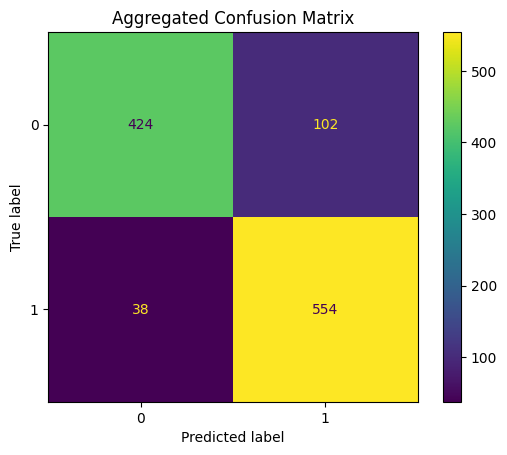

report of last fold
              precision    recall  f1-score   support

           0       0.99      0.77      0.86        95
           1       0.83      0.99      0.90       106

    accuracy                           0.89       201
   macro avg       0.91      0.88      0.88       201
weighted avg       0.90      0.89      0.88       201


Cross-Validation Accuracies: [0.8304347826086956, 0.8619246861924686, 0.9066666666666666, 0.8923766816143498, 0.8855721393034826]

Average Accuracy: 87.53949912771327+-2.6731028086892135%


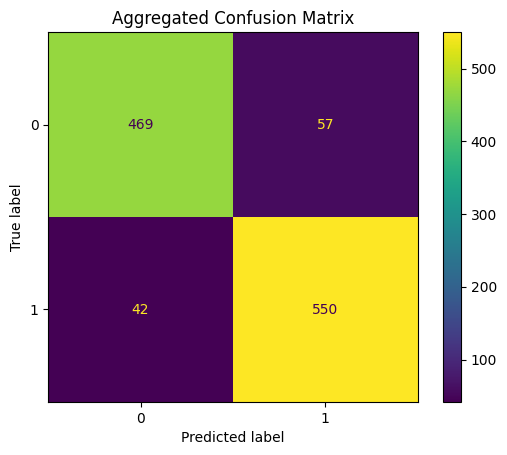

report of last fold
              precision    recall  f1-score   support

           0       0.86      0.82      0.84        95
           1       0.85      0.88      0.86       106

    accuracy                           0.85       201
   macro avg       0.85      0.85      0.85       201
weighted avg       0.85      0.85      0.85       201


Cross-Validation Accuracies: [0.9347826086956522, 0.8828451882845189, 0.9555555555555556, 0.9282511210762332, 0.8507462686567164]

Average Accuracy: 91.04361484537353+-3.8131423016491874%


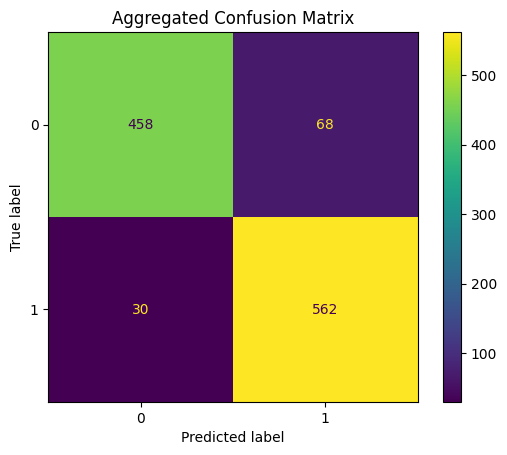

report of last fold
              precision    recall  f1-score   support

           0       0.95      0.79      0.86        95
           1       0.84      0.96      0.89       106

    accuracy                           0.88       201
   macro avg       0.89      0.88      0.88       201
weighted avg       0.89      0.88      0.88       201


Cross-Validation Accuracies: [0.9, 0.8744769874476988, 0.9555555555555556, 0.9506726457399103, 0.8805970149253731]

Average Accuracy: 91.22604407337074+-3.443964211195063%


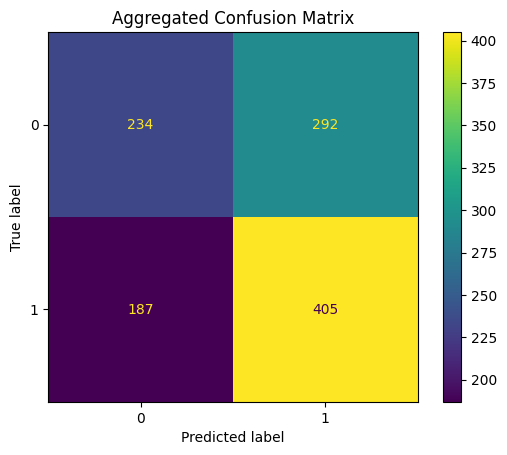

report of last fold
              precision    recall  f1-score   support

           0       0.45      0.36      0.40        95
           1       0.51      0.60      0.55       106

    accuracy                           0.49       201
   macro avg       0.48      0.48      0.48       201
weighted avg       0.48      0.49      0.48       201


Cross-Validation Accuracies: [0.5521739130434783, 0.6192468619246861, 0.5511111111111111, 0.6367713004484304, 0.48756218905472637]

Average Accuracy: 56.93730751164864+-5.357657505298891%


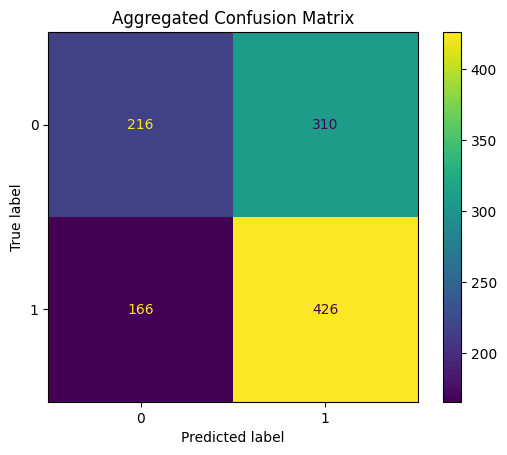

report of last fold
              precision    recall  f1-score   support

           0       0.45      0.33      0.38        95
           1       0.52      0.64      0.57       106

    accuracy                           0.49       201
   macro avg       0.48      0.48      0.47       201
weighted avg       0.48      0.49      0.48       201


Cross-Validation Accuracies: [0.5521739130434783, 0.6150627615062761, 0.5511111111111111, 0.6502242152466368, 0.4925373134328358]

Average Accuracy: 57.22218628680677+-5.498530917132089%


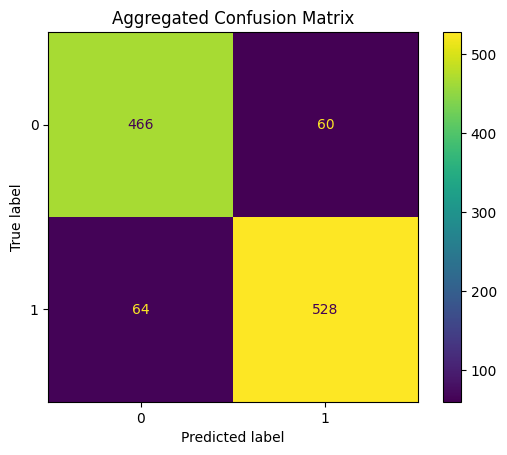

report of last fold
              precision    recall  f1-score   support

           0       0.80      0.80      0.80        95
           1       0.82      0.82      0.82       106

    accuracy                           0.81       201
   macro avg       0.81      0.81      0.81       201
weighted avg       0.81      0.81      0.81       201


Cross-Validation Accuracies: [0.9043478260869565, 0.8535564853556485, 0.9333333333333333, 0.9372197309417041, 0.8109452736318408]

Average Accuracy: 88.78805298698967+-4.872095983049152%


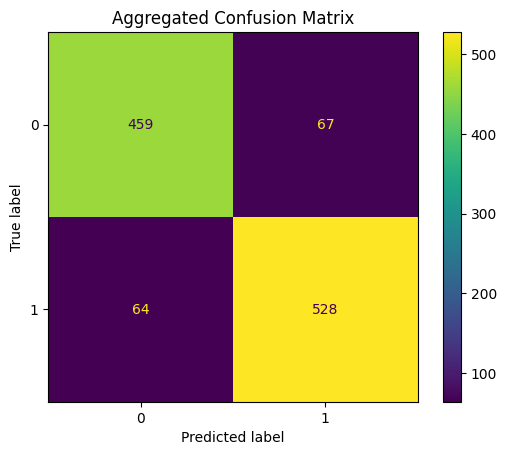

report of last fold
              precision    recall  f1-score   support

           0       0.80      0.81      0.81        95
           1       0.83      0.82      0.82       106

    accuracy                           0.82       201
   macro avg       0.82      0.82      0.82       201
weighted avg       0.82      0.82      0.82       201


Cross-Validation Accuracies: [0.9043478260869565, 0.8535564853556485, 0.92, 0.9147982062780269, 0.8159203980099502]

Average Accuracy: 88.17245831461165+-4.048287469569985%


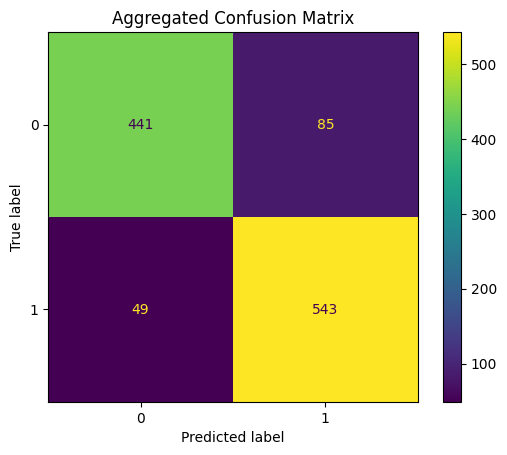

report of last fold
              precision    recall  f1-score   support

           0       0.95      0.88      0.92        95
           1       0.90      0.96      0.93       106

    accuracy                           0.93       201
   macro avg       0.93      0.92      0.92       201
weighted avg       0.93      0.93      0.93       201


Cross-Validation Accuracies: [0.8739130434782608, 0.8535564853556485, 0.8755555555555555, 0.8789237668161435, 0.9253731343283582]

Average Accuracy: 88.14643971067933+-2.36863711660384%


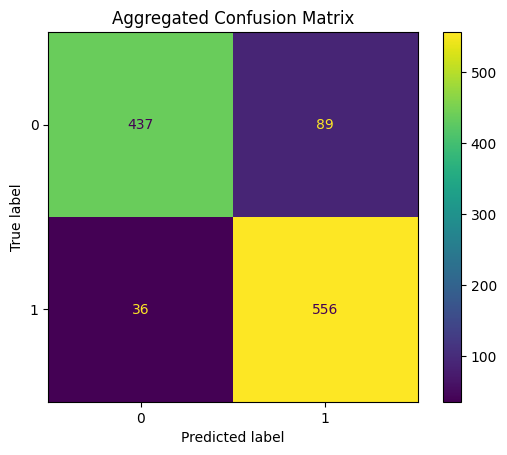

report of last fold
              precision    recall  f1-score   support

           0       0.96      0.85      0.91        95
           1       0.88      0.97      0.92       106

    accuracy                           0.92       201
   macro avg       0.92      0.91      0.91       201
weighted avg       0.92      0.92      0.91       201


Cross-Validation Accuracies: [0.8695652173913043, 0.8535564853556485, 0.9111111111111111, 0.8968609865470852, 0.9154228855721394]

Average Accuracy: 88.93033371954576+-2.4009825755888365%


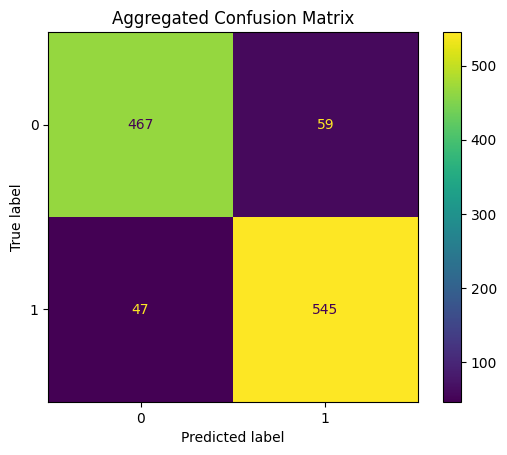

report of last fold
              precision    recall  f1-score   support

           0       0.84      0.78      0.81        95
           1       0.81      0.87      0.84       106

    accuracy                           0.83       201
   macro avg       0.83      0.82      0.82       201
weighted avg       0.83      0.83      0.83       201


Cross-Validation Accuracies: [0.9217391304347826, 0.8870292887029289, 0.9511111111111111, 0.9327354260089686, 0.8258706467661692]

Average Accuracy: 90.36971206047919+-4.416242847862342%


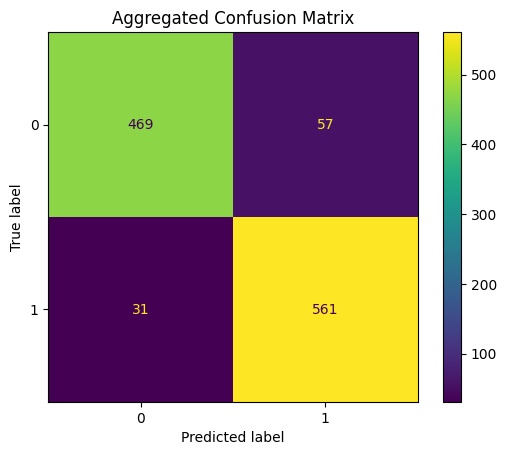

report of last fold
              precision    recall  f1-score   support

           0       0.90      0.81      0.85        95
           1       0.84      0.92      0.88       106

    accuracy                           0.87       201
   macro avg       0.87      0.86      0.86       201
weighted avg       0.87      0.87      0.87       201


Cross-Validation Accuracies: [0.9260869565217391, 0.8786610878661087, 0.9688888888888889, 0.9641255605381166, 0.8656716417910447]

Average Accuracy: 92.06868271211796+-4.250260484702758%


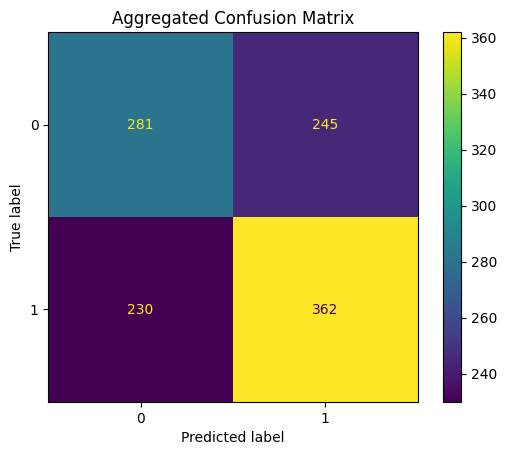

report of last fold
              precision    recall  f1-score   support

           0       0.48      0.52      0.49        95
           1       0.53      0.49      0.51       106

    accuracy                           0.50       201
   macro avg       0.50      0.50      0.50       201
weighted avg       0.50      0.50      0.50       201


Cross-Validation Accuracies: [0.5565217391304348, 0.602510460251046, 0.5555555555555556, 0.6502242152466368, 0.5024875621890548]

Average Accuracy: 57.345990647454556+-4.976190254434406%


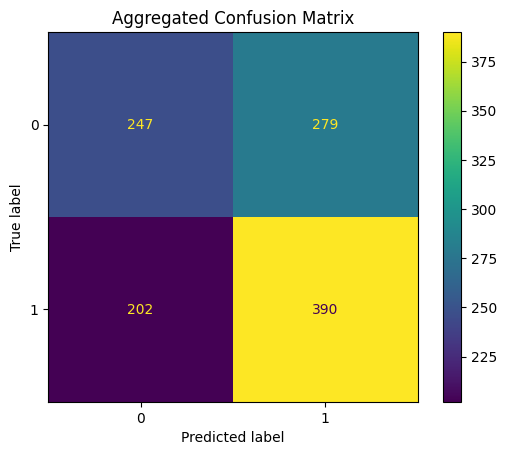

report of last fold
              precision    recall  f1-score   support

           0       0.50      0.49      0.50        95
           1       0.55      0.56      0.55       106

    accuracy                           0.53       201
   macro avg       0.53      0.53      0.53       201
weighted avg       0.53      0.53      0.53       201


Cross-Validation Accuracies: [0.5739130434782609, 0.5774058577405857, 0.5333333333333333, 0.6322869955156951, 0.527363184079602]

Average Accuracy: 56.88604828294953+-3.769795344013717%


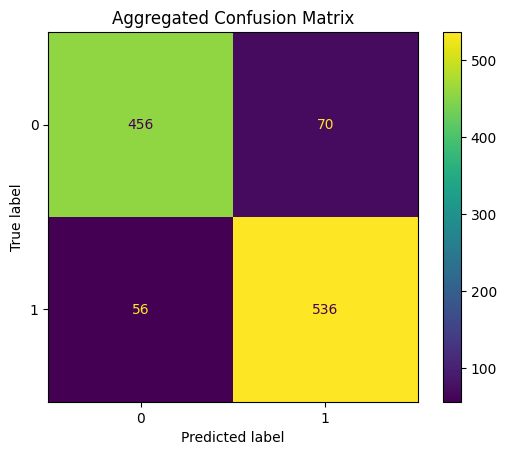

report of last fold
              precision    recall  f1-score   support

           0       0.80      0.80      0.80        95
           1       0.82      0.82      0.82       106

    accuracy                           0.81       201
   macro avg       0.81      0.81      0.81       201
weighted avg       0.81      0.81      0.81       201


Cross-Validation Accuracies: [0.9217391304347826, 0.8493723849372385, 0.9111111111111111, 0.9372197309417041, 0.8109452736318408]

Average Accuracy: 88.60775262113356+-4.797098762174361%


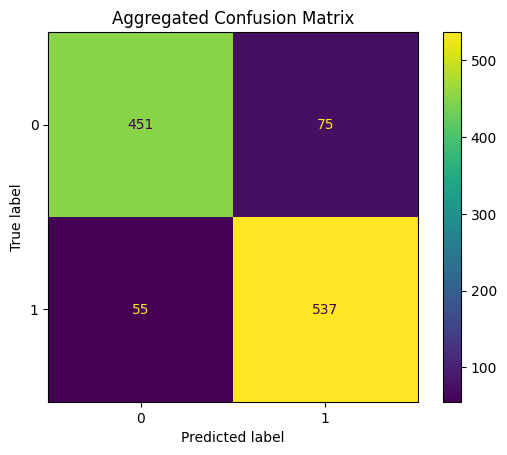

report of last fold
              precision    recall  f1-score   support

           0       0.85      0.78      0.81        95
           1       0.82      0.88      0.85       106

    accuracy                           0.83       201
   macro avg       0.83      0.83      0.83       201
weighted avg       0.83      0.83      0.83       201


Cross-Validation Accuracies: [0.8869565217391304, 0.8744769874476988, 0.9066666666666666, 0.9147982062780269, 0.8308457711442786]

Average Accuracy: 88.27488306551604+-2.959486779218985%


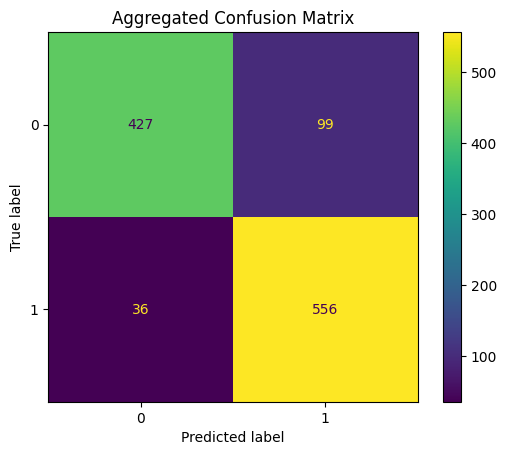

report of last fold
              precision    recall  f1-score   support

           0       0.98      0.85      0.91        95
           1       0.88      0.98      0.93       106

    accuracy                           0.92       201
   macro avg       0.93      0.92      0.92       201
weighted avg       0.93      0.92      0.92       201


Cross-Validation Accuracies: [0.8739130434782608, 0.8577405857740585, 0.8933333333333333, 0.8565022421524664, 0.9203980099502488]

Average Accuracy: 88.03774429376736+-2.405718959106859%


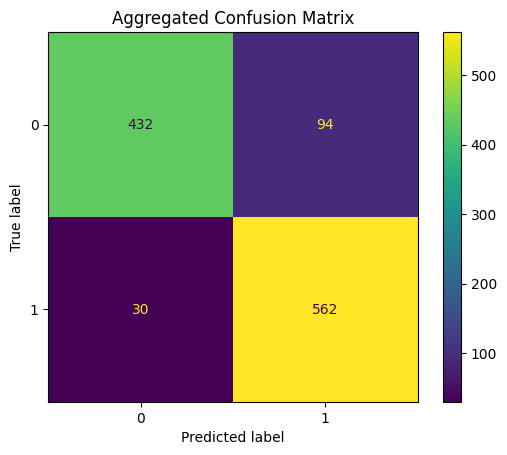

report of last fold
              precision    recall  f1-score   support

           0       0.97      0.82      0.89        95
           1       0.86      0.98      0.92       106

    accuracy                           0.91       201
   macro avg       0.92      0.90      0.90       201
weighted avg       0.91      0.91      0.90       201


Cross-Validation Accuracies: [0.8608695652173913, 0.8786610878661087, 0.8977777777777778, 0.905829596412556, 0.9054726368159204]

Average Accuracy: 88.97221328179509+-1.7477068106132094%


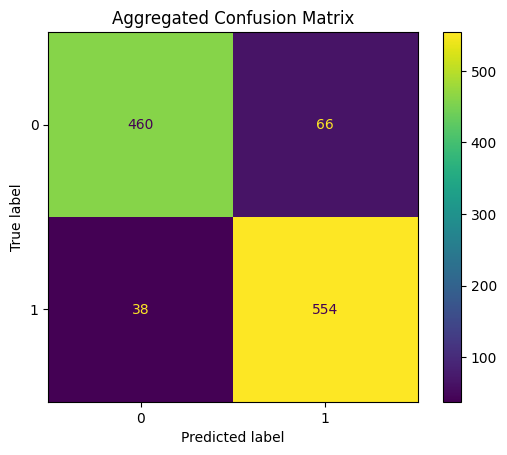

report of last fold
              precision    recall  f1-score   support

           0       0.86      0.78      0.82        95
           1       0.82      0.89      0.85       106

    accuracy                           0.84       201
   macro avg       0.84      0.83      0.83       201
weighted avg       0.84      0.84      0.84       201


Cross-Validation Accuracies: [0.9304347826086956, 0.8828451882845189, 0.9511111111111111, 0.9282511210762332, 0.835820895522388]

Average Accuracy: 90.56926197205894+-4.144384859937726%


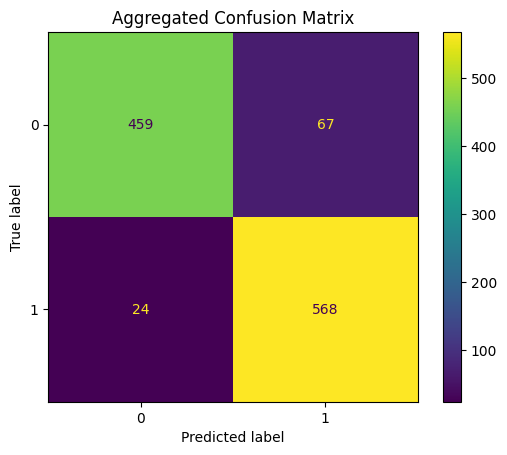

report of last fold
              precision    recall  f1-score   support

           0       0.97      0.73      0.83        95
           1       0.80      0.98      0.88       106

    accuracy                           0.86       201
   macro avg       0.89      0.85      0.86       201
weighted avg       0.88      0.86      0.86       201


Cross-Validation Accuracies: [0.9304347826086956, 0.8744769874476988, 0.96, 0.9641255605381166, 0.8606965174129353]

Average Accuracy: 91.79467696014892+-4.295141144208918%


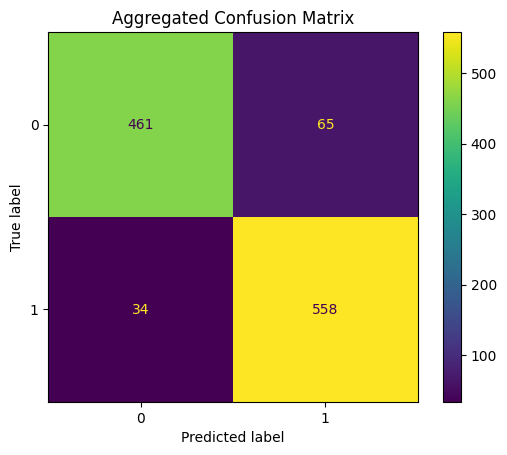

report of last fold
              precision    recall  f1-score   support

           0       0.90      0.82      0.86        95
           1       0.85      0.92      0.88       106

    accuracy                           0.87       201
   macro avg       0.87      0.87      0.87       201
weighted avg       0.87      0.87      0.87       201


Cross-Validation Accuracies: [0.9347826086956522, 0.8786610878661087, 0.9333333333333333, 0.9372197309417041, 0.8706467661691543]

Average Accuracy: 91.09287054011907+-2.975240443666696%


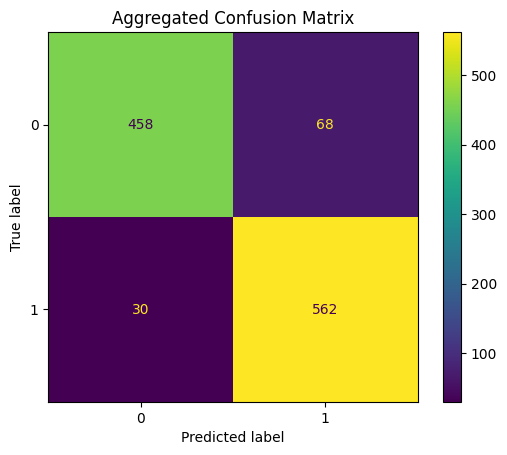

report of last fold
              precision    recall  f1-score   support

           0       0.95      0.79      0.86        95
           1       0.84      0.96      0.89       106

    accuracy                           0.88       201
   macro avg       0.89      0.88      0.88       201
weighted avg       0.89      0.88      0.88       201


Cross-Validation Accuracies: [0.9, 0.8744769874476988, 0.9555555555555556, 0.9506726457399103, 0.8805970149253731]

Average Accuracy: 91.22604407337074+-3.443964211195063%


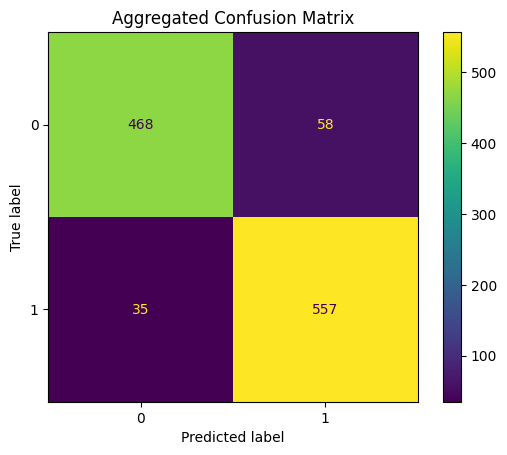

report of last fold
              precision    recall  f1-score   support

           0       0.87      0.82      0.84        95
           1       0.85      0.89      0.87       106

    accuracy                           0.86       201
   macro avg       0.86      0.85      0.85       201
weighted avg       0.86      0.86      0.86       201


Cross-Validation Accuracies: [0.9478260869565217, 0.8661087866108786, 0.9377777777777778, 0.9730941704035875, 0.8557213930348259]

Average Accuracy: 91.61056429567182+-4.66251081262135%


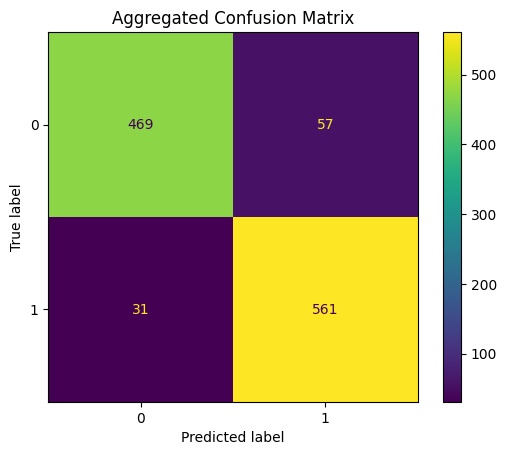

report of last fold
              precision    recall  f1-score   support

           0       0.90      0.81      0.85        95
           1       0.84      0.92      0.88       106

    accuracy                           0.87       201
   macro avg       0.87      0.86      0.86       201
weighted avg       0.87      0.87      0.87       201


Cross-Validation Accuracies: [0.9260869565217391, 0.8786610878661087, 0.9688888888888889, 0.9641255605381166, 0.8656716417910447]

Average Accuracy: 92.06868271211796+-4.250260484702758%


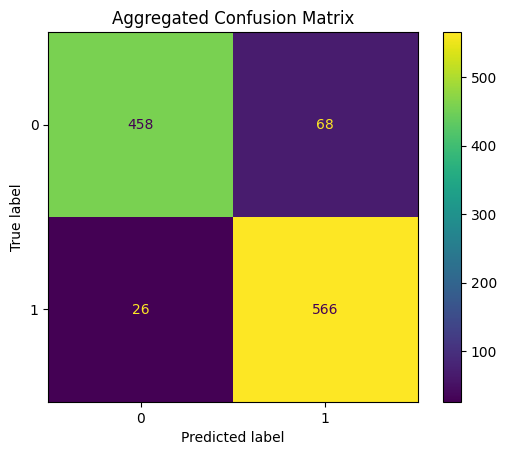

report of last fold
              precision    recall  f1-score   support

           0       0.89      0.82      0.85        95
           1       0.85      0.91      0.88       106

    accuracy                           0.87       201
   macro avg       0.87      0.86      0.86       201
weighted avg       0.87      0.87      0.87       201


Cross-Validation Accuracies: [0.9391304347826087, 0.8744769874476988, 0.9422222222222222, 0.9551569506726457, 0.8656716417910447]

Average Accuracy: 91.5331647383244+-3.744531872693832%


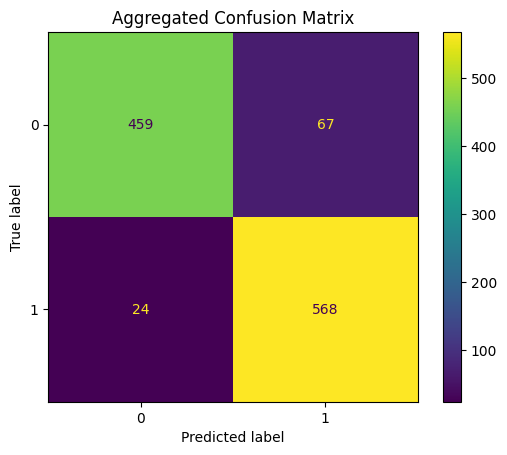

report of last fold
              precision    recall  f1-score   support

           0       0.97      0.73      0.83        95
           1       0.80      0.98      0.88       106

    accuracy                           0.86       201
   macro avg       0.89      0.85      0.86       201
weighted avg       0.88      0.86      0.86       201


Cross-Validation Accuracies: [0.9304347826086956, 0.8744769874476988, 0.96, 0.9641255605381166, 0.8606965174129353]

Average Accuracy: 91.79467696014892+-4.295141144208918%
                  Model                 Feature Set Feature Reduction  \
0                   KNN        time_domain_features               LDA   
1                   KNN        time_domain_features              None   
2                   KNN                        MFCC               LDA   
3                   KNN                        MFCC              None   
4                   KNN           Spectral Contrast               LDA   
5                   KNN           Spectra

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

# Define the feature sets
mfcc_features = [f'mfcc{i+1}' for i in range(13)]
spectral_contrast_features = [f'sp_contrast{i+1}' for i in range(7)]
combined_features = mfcc_features + spectral_contrast_features

# Define the target column
feature_df['class'] = feature_df['labels'].apply(lambda x: 0 if x == 'female' else 1)
target_column = 'class'

# Define the models
models = {
    'KNN': KNeighborsClassifier(n_neighbors=5),
    'Logistic Regression': LogisticRegression(),
    'SVM': SVC(probability=True)
}

# Define the feature sets
feature_sets = {
    'time_domain_features' : ['zero_crossing_rate', 'mean_rms_energy'],
    'MFCC': mfcc_features,
    'Spectral Contrast': spectral_contrast_features,
    'Combined': combined_features
}

feature_reductions = {
    'LDA': LinearDiscriminantAnalysis(),
    'None': None
}

# Run cross-validation and store results
results = []
for model_name, model in models.items():
    for feature_set_name, feature_columns in feature_sets.items():
        for reduction_name, reduction_func in feature_reductions.items():
            mean_accuracy, std_accuracy, cm = k_fold_cross_validation(feature_df, feature_columns, None, target_column,
                                                                      model, reduction_func, group_by ='student_ID', k=5)
            results.append({
                'Model': model_name,
                'Feature Set': feature_set_name,
                'Feature Reduction': reduction_name,
                'Mean Accuracy': mean_accuracy,
                'Std Accuracy': std_accuracy,
                'Confusion Matrix': cm
                })
for model_name, model in models.items():
  for reduction_name, reduction_func in feature_reductions.items():
    mean_accuracy, std_accuracy, cm = k_fold_cross_validation(feature_df, mfcc_features, spectral_contrast_features, target_column,
                                                                      model, reduction_func, group_by ='student_ID', k=5)
    results.append({
        'Model': model_name,
        'Feature Set': 'mfcc(lda)+sp_contrast(lda)',
        'Feature Reduction': reduction_name,
        'Mean Accuracy': mean_accuracy,
        'Std Accuracy': std_accuracy,
        'Confusion Matrix': cm
        })

results_df = pd.DataFrame(results)
print(results_df)

Maximum accuracy if feature reduction(LDA): 91.61%


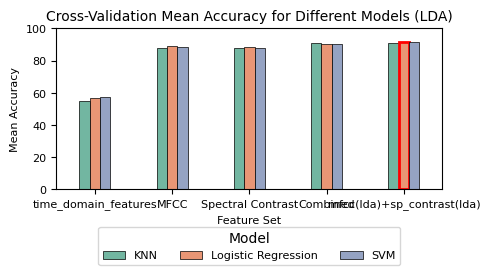

Maximum accuracy if feature reduction(None): 92.07%


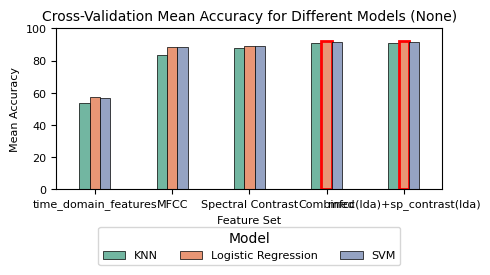

In [ ]:
# List of feature reduction methods
feature_reductions = results_df['Feature Reduction'].unique()

# Set a pleasing color palette
sns.set_palette("Set2")

# Loop to plot bar charts for each feature reduction method
for reduction in feature_reductions:
    # Filter data for the current feature reduction method
    filtered_results = results_df[results_df['Feature Reduction'] == reduction]
    max_value = filtered_results['Mean Accuracy'].max()
    print(f"Maximum accuracy if feature reduction({reduction}): {max_value:.2f}%")

    # Plot the bar chart
    plt.figure(figsize=(5, 3))
    ax = sns.barplot(x='Feature Set', y='Mean Accuracy', hue='Model', data=filtered_results, errorbar=None, width=0.4)


    # Add solid lines around each bar
    for bar in ax.patches:
        if bar.get_height() == max_value:
            bar.set_edgecolor('red')
            bar.set_linewidth(2)
        else:
            bar.set_edgecolor('black')
            bar.set_linewidth(0.5)

    # Set titles and labels
    plt.title(f'Cross-Validation Mean Accuracy for Different Models ({reduction})', fontsize=10)
    plt.xlabel('Feature Set', fontsize=8)
    plt.ylabel('Mean Accuracy', fontsize=8)
    plt.ylim(0, 100)
    plt.xticks(fontsize=8)
    plt.yticks(fontsize=8)
    plt.legend(title='Model', loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=3, fontsize=8)

    plt.tight_layout()
    plt.show()
